# Finding lost animals 

#### - A team Alpha project

## Problem statment and target audiance 

with our code and observations we tried different prediction models to see which one helps us predict the location of a lost pet . We also went one step ahead and tried making an user interface which takes in their house data and helps predict where the pet could have gone to. Our target audiance are pet owners whoes pets are inquisitive about wandering around the locality and end up getting lost on the way home . 



## Required Libraries 

In [1]:
import pandas as pd

import pickle 

import seaborn as sns

import numpy as np
from numpy import mean
from numpy import std

import matplotlib as plt 
%matplotlib inline
from matplotlib.pylab import rcParams
import matplotlib.pyplot as plt

import sklearn
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, cross_val_predict

from IPython.core.interactiveshell import InteractiveShell

## Loading Data

In [2]:
df = pd.read_excel("ampa_wmt_rto_hackathon_july-22_data.xlsx", sheet_name=['animal_data','shelter_data'])
animal_data = df['animal_data']
shelter_data = df['shelter_data']

In [3]:
animal_data

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address
0,Rochester,2021-01-28,Dog,-77.633991,43.177237,-77.634618,43.178387,0.085445,158 Glenwood ave Rochester 14613,54 Tacoma Street Rochester NY 14613
1,Rochester,2021-01-30,Dog,-77.599173,43.185495,-77.583367,43.171650,1.245466,1094 HUDSON AVE 14621 Rochester 14621,31 CROMBIE ST Rochester NY 14605
2,Rochester,2021-01-30,Dog,-77.617074,43.241926,-77.615373,43.249483,0.528722,17 Hughes pl Rochester 14608,4313 LAKE AVE Rochester NY 14612
3,Rochester,2021-02-01,Dog,-77.643231,43.180933,-77.645970,43.179665,0.163735,DRIVING PK and 2 CANARY ST. Rochester 14608,1 CANARY ST Rochester NY 14613
4,Rochester,2021-02-03,Dog,-77.650684,43.143780,-77.653187,43.145435,0.170467,74 Thurston Rd Rochester 14608,216 DEPEW Street Rochester NY 14611
...,...,...,...,...,...,...,...,...,...,...
23075,Atlanta,2019-01-31,Dog,-84.288835,33.726502,-84.276410,33.706781,1.536071,"2476 Brentwood Road DECATUR, 30032, GA",2176 Loving Drive Decatur GA 30037
23076,Atlanta,2019-11-18,Dog,-84.191581,33.718448,-84.192158,33.718910,0.046022,4822 Truitt Ln GA 30035,4807 Wilkins Station Dr GA 30035
23077,Atlanta,2019-11-19,Dog,-84.280404,33.829848,-84.281226,33.830973,0.090819,"1631 Hartland Drive Decatur, 30033 GA",1668 Hartland Dr Decatur GA 30033
23078,Atlanta,2019-02-12,Dog,-84.285380,33.697093,-84.283554,33.698049,0.124132,2549 Mcglynn Drive GA 30034,254 McGlynn Drive Decatur GA 30034


## Understanding Animal Data 

In [4]:
animal_data.columns

Index(['shelter_id', 'intake_date', 'Species', 'found_lng', 'found_lat',
       'outcome_lng', 'outcome_lat', 'distance_miles', 'found_address',
       'outcome_address'],
      dtype='object')

In [5]:
dt = animal_data[['shelter_id','Species','distance_miles']]

In [6]:
dt

,shelter_id,Species,distance_miles
0,Rochester,Dog,0.085445
1,Rochester,Dog,1.245466
2,Rochester,Dog,0.528722
3,Rochester,Dog,0.163735
4,Rochester,Dog,0.170467
...,...,...,...
23075,Atlanta,Dog,1.536071
23076,Atlanta,Dog,0.046022
23077,Atlanta,Dog,0.090819
23078,Atlanta,Dog,0.124132


<Figure size 1152x2160 with 0 Axes>

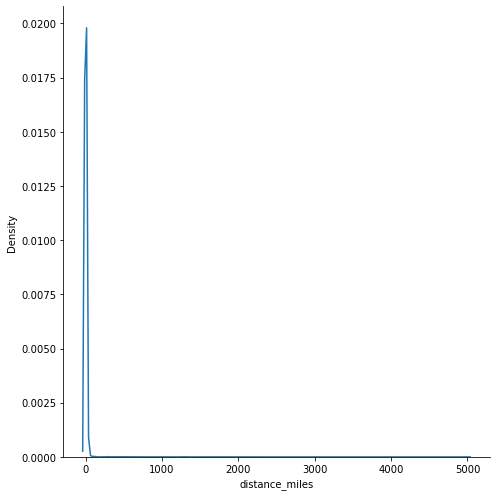

In [7]:
plt.figure(figsize=(16, 30))
g = sns.displot(data=dt, x="distance_miles", kind= "kde", height = 7)

most of the animals were found close to the outcome address and were able to be returned 

In [8]:
dt['shelter_id'].unique()

array(['Rochester', 'Oakland', 'Fresno', 'Mcallen', 'Tucson', 'Madera',
       'Las Vegas', 'Dallas', 'San Diego', 'Pasco', 'Atlanta'],
      dtype=object)

In [9]:
keys = [1,2,3,4,5,6,7,8,9,10,11]
x = dict(zip(dt['shelter_id'].unique(), keys))
x

{'Rochester': 1,
 'Oakland': 2,
 'Fresno': 3,
 'Mcallen': 4,
 'Tucson': 5,
 'Madera': 6,
 'Las Vegas': 7,
 'Dallas': 8,
 'San Diego': 9,
 'Pasco': 10,
 'Atlanta': 11}

In [10]:
dt2=dt.replace({"shelter_id": x})

In [11]:
dt2

,shelter_id,Species,distance_miles
0,1,Dog,0.085445
1,1,Dog,1.245466
2,1,Dog,0.528722
3,1,Dog,0.163735
4,1,Dog,0.170467
...,...,...,...
23075,11,Dog,1.536071
23076,11,Dog,0.046022
23077,11,Dog,0.090819
23078,11,Dog,0.124132


In [12]:
dt['Species'].unique()

array(['Dog', 'Cat', 'Pet Reptile', 'Pig', 'Horse', 'Rabbit', 'DOG', nan,
       'Other'], dtype=object)

In [13]:
dt2.loc[dt2['Species'] == "DOG", "Species"] = 'Dog'

In [14]:
dt2['Species'].unique()

array(['Dog', 'Cat', 'Pet Reptile', 'Pig', 'Horse', 'Rabbit', nan,
       'Other'], dtype=object)

In [15]:
dt2['Species'].nunique()

7

In [16]:
dt2.nunique()

shelter_id           11
Species               7
distance_miles    18458
dtype: int64

In [17]:
keys2 = [101,102,103,104,105,106,100,107]
y = dict(zip(dt2['Species'].unique(), keys2))
y

{'Dog': 101,
 'Cat': 102,
 'Pet Reptile': 103,
 'Pig': 104,
 'Horse': 105,
 'Rabbit': 106,
 nan: 100,
 'Other': 107}

In [18]:
dt3=dt2.replace({"Species": y})

In [19]:
dt3['Species'].unique()

array([101, 102, 103, 104, 105, 106, 100, 107])

In [20]:
dt3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23080 entries, 0 to 23079
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   shelter_id      23080 non-null  int64  
 1   Species         23080 non-null  int64  
 2   distance_miles  23054 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 541.1 KB


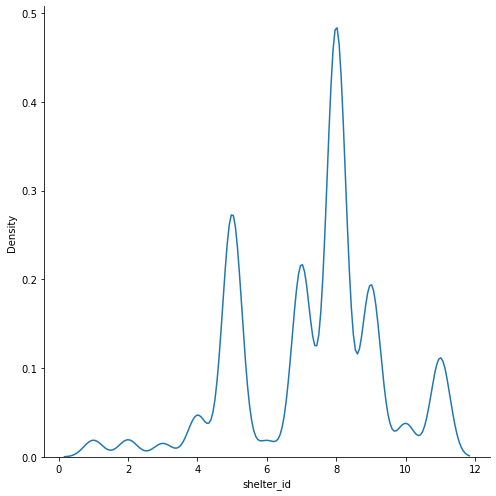

In [21]:
sns.displot(data=dt3,  x="shelter_id", kind="kde",height = 7)

denisity of most animals are at shlter id 8 being dallas 

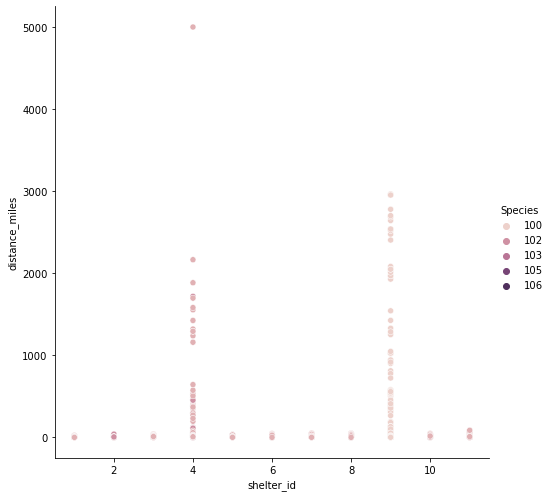

In [22]:
ax = sns.relplot(data=dt3, x="shelter_id", y="distance_miles",hue = "Species",height = 7)
g.ax.axline(xy1=(10, 10), slope=.2, color="b", dashes=(5, 2))

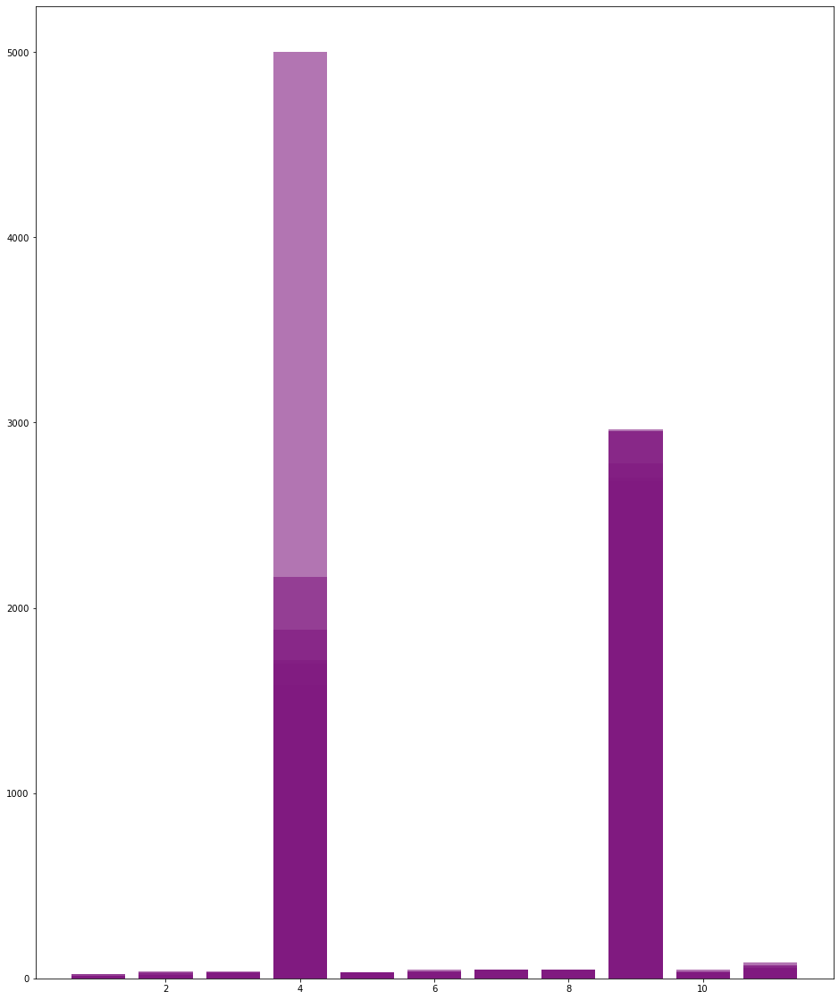

In [23]:
plt.figure(figsize=(16, 20))
plt.bar(dt3.shelter_id, dt3.distance_miles, color = (0.5,0.1,0.5,0.6))
plt.show()

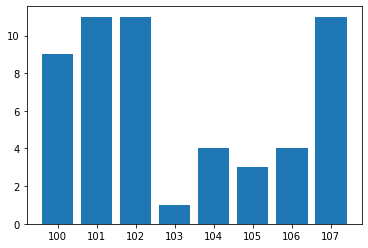

In [24]:
plt.bar(dt3.Species, dt3.shelter_id,)
plt.show()

- dogs and cats are the most lost pets 
- most of the distances covered by the pets are close to the owner houses 

## Understanding shelter data 

In [25]:
shelter_data = df['shelter_data']

In [26]:
shelter_data

,shelter_id,annual_intake_2019,annual_intake_2020,annual_intake_2021,jurisdiction_size_sq_km,justidiction_state,jurisdiction_region,jurisdiction_pop_size,jurisdiction_pop_density_person_per_sq_km
0,Rochester,3867,2732.0,2677.0,3541,NY,Monroe County,741770,209.480373
1,Oakland,6188,5234.0,7613.0,1914,CA,Alameda County,1682353,878.972309
2,Fresno,8001,6246.0,6634.0,15568,CA,Fresno County,999101,64.176580
3,Mcallen,21815,15511.0,15283.0,4100,TX,Hidalgo County,868707,211.879756
4,Tucson,27064,17547.0,23940.0,23799,AZ,Pima County,1043433,43.843565
5,Madera,5166,NaN,NaN,5576,CA,Madera County,156255,28.022776
6,Las Vegas,27922,17957.0,NaN,20878,NV,Clark County,2265461,108.509484
7,Dallas,40155,19594.0,18533.0,1992,TX,Dallas City,1304379,654.808735
8,San Diego,33555,31871.0,30803.0,11036,TX,San Diego County,3338000,302.464661
9,Pasco,9906,11370.0,6510.0,2250,FL,Pasco County,553947,246.198667


In [27]:
dfnew = shelter_data[['shelter_id','annual_intake_2019','annual_intake_2020','annual_intake_2021']]

<AxesSubplot:xlabel='shelter_id'>

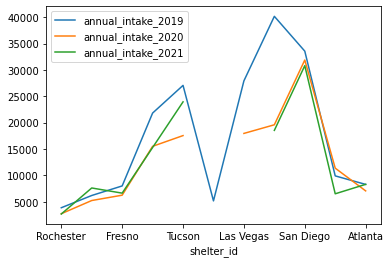

In [28]:
dfnew.set_index('shelter_id').plot()

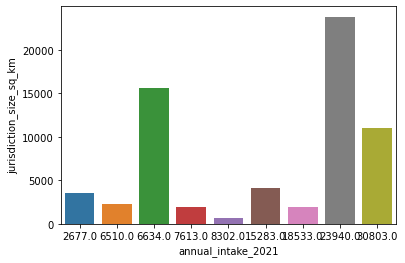

In [29]:
ax = sns.barplot(data=shelter_data, x = 'annual_intake_2021'  , y = 'jurisdiction_size_sq_km')

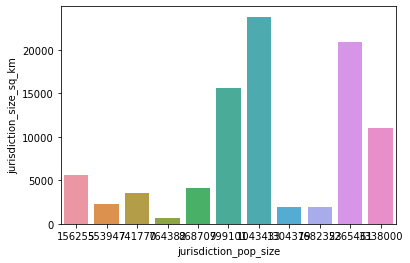

In [30]:
ax = sns.barplot(data=shelter_data, x = 'jurisdiction_pop_size'  , y = 'jurisdiction_size_sq_km')

## Observations from given data 

From visualisations we understand 
- Shelter in dallas tho less in size compared to other shlters has more density of animal intake and has increased this intake stedily over the years . 
- Dallas shelter has the highest size/pop ratio helping with the animal adoptation number 
- The radius of finding an pet is close to the owners house most of the time 
- Most number of species in the shelters are dogs and cats  

In [31]:
ax1=animal_data.replace({"shelter_id": x})
ax1.loc[ax1['Species'] == "DOG", "Species"] = 'Dog'
keys2 = [101,102,103,104,105,106,100,107]
y = dict(zip(dt2['Species'].unique(), keys2))
ax2 = ax1.replace({"Species": y})
mask3 = (((ax2['shelter_id'] == 7)))
dt4 = ax2[mask3][['shelter_id', 'intake_date', 'Species', 'found_lng', 'found_lat',
       'outcome_lng', 'outcome_lat', 'distance_miles', 'found_address',
       'outcome_address']]

In [32]:
dt4

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address
6296,7,2019-01-01,101,-115.106554,36.176480,-115.239166,36.290830,10.818320,655 MOJAVE RD LAS VEGAS NV 89101,6658 ELKHORN RD LAS VEGAS NV 89131
6297,7,2019-01-01,101,-115.133817,36.247944,-115.148735,36.254894,0.961063,4824 CELSION ROCK ST NORTH LAS VEGAS NV 89081,5216 JOSE ERNESTO ST NORTH LAS VEGAS NV 89031
6298,7,2019-01-01,101,-115.156539,36.273654,-115.186855,36.240394,2.850475,1030 STABLE GLEN DR NORTH LAS VEGAS NV 89031,4427 NORMA JEAN LN NORTH LAS VEGAS NV 89031
6299,7,2019-01-01,101,-115.108231,36.196280,-115.096616,36.230593,2.453264,2842 LAKE MEAD BLVD NORTH LAS VEGAS NV 89030,3903 EBLICK WASH DR LAS VEGAS NV 89115
6300,7,2019-01-01,101,-115.177355,36.284546,-115.179977,36.280232,0.331535,6600 ALIANTE PKWY NORTH LAS VEGAS NV 89084,2904 GNATCATCHER AVE NORTH LAS VEGAS NV 89084
...,...,...,...,...,...,...,...,...,...,...
9772,7,2019-12-31,101,-115.106300,36.216030,-115.093200,36.210170,0.834574,3130 BLACKFOOT CT NORTH LAS VEGAS NV 89030,3847 ALTO AVE LAS VEGAS NV 89115
9773,7,2019-12-31,101,-115.235100,36.189300,-115.078500,36.119840,9.977234,6500 VEGAS DR LAS VEGAS NV 89108,3834 FLORRIE AVE LAS VEGAS NV 89121
9774,7,2019-12-31,101,-115.167300,36.124400,-115.145600,36.093190,2.471943,3355 LAS VEGAS BLVD LAS VEGAS NV 89109,3770 SWENSON ST LAS VEGAS NV 89119
9775,7,2019-12-31,101,-115.125400,36.170490,-115.125000,36.170360,0.027519,389 BRUCE ST LAS VEGAS NV 89101,1701 CEDAR AVE LAS VEGAS NV 89101


In [33]:
dt4['month'] = pd. DatetimeIndex(dt4['intake_date']). month

In [34]:
dt4

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address,month
6296,7,2019-01-01,101,-115.106554,36.176480,-115.239166,36.290830,10.818320,655 MOJAVE RD LAS VEGAS NV 89101,6658 ELKHORN RD LAS VEGAS NV 89131,1
6297,7,2019-01-01,101,-115.133817,36.247944,-115.148735,36.254894,0.961063,4824 CELSION ROCK ST NORTH LAS VEGAS NV 89081,5216 JOSE ERNESTO ST NORTH LAS VEGAS NV 89031,1
6298,7,2019-01-01,101,-115.156539,36.273654,-115.186855,36.240394,2.850475,1030 STABLE GLEN DR NORTH LAS VEGAS NV 89031,4427 NORMA JEAN LN NORTH LAS VEGAS NV 89031,1
6299,7,2019-01-01,101,-115.108231,36.196280,-115.096616,36.230593,2.453264,2842 LAKE MEAD BLVD NORTH LAS VEGAS NV 89030,3903 EBLICK WASH DR LAS VEGAS NV 89115,1
6300,7,2019-01-01,101,-115.177355,36.284546,-115.179977,36.280232,0.331535,6600 ALIANTE PKWY NORTH LAS VEGAS NV 89084,2904 GNATCATCHER AVE NORTH LAS VEGAS NV 89084,1
...,...,...,...,...,...,...,...,...,...,...,...
9772,7,2019-12-31,101,-115.106300,36.216030,-115.093200,36.210170,0.834574,3130 BLACKFOOT CT NORTH LAS VEGAS NV 89030,3847 ALTO AVE LAS VEGAS NV 89115,12
9773,7,2019-12-31,101,-115.235100,36.189300,-115.078500,36.119840,9.977234,6500 VEGAS DR LAS VEGAS NV 89108,3834 FLORRIE AVE LAS VEGAS NV 89121,12
9774,7,2019-12-31,101,-115.167300,36.124400,-115.145600,36.093190,2.471943,3355 LAS VEGAS BLVD LAS VEGAS NV 89109,3770 SWENSON ST LAS VEGAS NV 89119,12
9775,7,2019-12-31,101,-115.125400,36.170490,-115.125000,36.170360,0.027519,389 BRUCE ST LAS VEGAS NV 89101,1701 CEDAR AVE LAS VEGAS NV 89101,12


In [35]:
dt4['counts'] = dt4.month.map(dt4.month.value_counts())

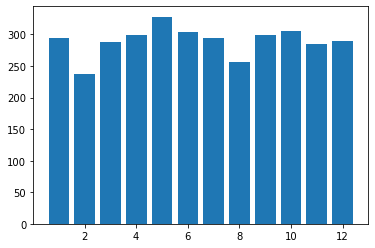

In [36]:
plt.bar(dt4.month,dt4.counts)
plt.show()
## we understand nothing about the intake patters from below 

In [37]:
dt4

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address,month,counts
6296,7,2019-01-01,101,-115.106554,36.176480,-115.239166,36.290830,10.818320,655 MOJAVE RD LAS VEGAS NV 89101,6658 ELKHORN RD LAS VEGAS NV 89131,1,294
6297,7,2019-01-01,101,-115.133817,36.247944,-115.148735,36.254894,0.961063,4824 CELSION ROCK ST NORTH LAS VEGAS NV 89081,5216 JOSE ERNESTO ST NORTH LAS VEGAS NV 89031,1,294
6298,7,2019-01-01,101,-115.156539,36.273654,-115.186855,36.240394,2.850475,1030 STABLE GLEN DR NORTH LAS VEGAS NV 89031,4427 NORMA JEAN LN NORTH LAS VEGAS NV 89031,1,294
6299,7,2019-01-01,101,-115.108231,36.196280,-115.096616,36.230593,2.453264,2842 LAKE MEAD BLVD NORTH LAS VEGAS NV 89030,3903 EBLICK WASH DR LAS VEGAS NV 89115,1,294
6300,7,2019-01-01,101,-115.177355,36.284546,-115.179977,36.280232,0.331535,6600 ALIANTE PKWY NORTH LAS VEGAS NV 89084,2904 GNATCATCHER AVE NORTH LAS VEGAS NV 89084,1,294
...,...,...,...,...,...,...,...,...,...,...,...,...
9772,7,2019-12-31,101,-115.106300,36.216030,-115.093200,36.210170,0.834574,3130 BLACKFOOT CT NORTH LAS VEGAS NV 89030,3847 ALTO AVE LAS VEGAS NV 89115,12,290
9773,7,2019-12-31,101,-115.235100,36.189300,-115.078500,36.119840,9.977234,6500 VEGAS DR LAS VEGAS NV 89108,3834 FLORRIE AVE LAS VEGAS NV 89121,12,290
9774,7,2019-12-31,101,-115.167300,36.124400,-115.145600,36.093190,2.471943,3355 LAS VEGAS BLVD LAS VEGAS NV 89109,3770 SWENSON ST LAS VEGAS NV 89119,12,290
9775,7,2019-12-31,101,-115.125400,36.170490,-115.125000,36.170360,0.027519,389 BRUCE ST LAS VEGAS NV 89101,1701 CEDAR AVE LAS VEGAS NV 89101,12,290


## Mapping values to understand location effects 

Only considering dallas data for understanding a small set 

In [38]:
import folium

In [39]:
outcome_loc = [dt4['outcome_lat'].mean(), dt4['outcome_lng'].mean()]
outcome_map = folium.Map(location = outcome_loc, tiles="Openstreetmap", zoom_start = 5, control_scale=True)
for index, loc in dt4.iterrows():
    folium.CircleMarker([loc['outcome_lat'], loc['outcome_lng']], radius=2, weight=5,color="red").add_to(outcome_map)
folium.LayerControl().add_to(outcome_map)
outcome_map

In [40]:
found_loc = [dt4['found_lat'].mean(), dt4['found_lng'].mean()]
map1 = folium.Map(location = found_loc, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in dt4.iterrows():
    folium.CircleMarker([loc['found_lat'], loc['found_lng']], radius=2, weight=5).add_to(map1)
folium.LayerControl().add_to(map1)
map1

## observations from maps 
animals are found very rarley on a freeeway where are hugh ways and main roads have 1:5 chance of spotting an animal to be found from the surrounding houses 

## Predicting the location where the animals can be found 

### understanding linear regression model

In [41]:
y = dt4[['found_lng','found_lat']]
dt4.drop(['shelter_id','found_lng','found_lat','intake_date','month','counts','found_address','outcome_address'] , axis=1 , inplace = True)

In [42]:
X_train, X_test, y_train, y_test = train_test_split(dt4, y, test_size=0.2 , random_state=43)

In [43]:
min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = min_max_scaler.fit_transform(X_train)
X_test_minmax = min_max_scaler.transform(X_test)

In [44]:
regressor=LinearRegression()
regressor.fit(X_train_minmax,y_train)

LinearRegression()

In [45]:
y_pred=regressor.predict(X_test_minmax)

In [46]:
l = pd.DataFrame(y_pred)

In [47]:
predicted_values = [l[1].mean(), l[0].mean()]
predicted_map = folium.Map(location = predicted_values, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in l.iterrows():
    folium.CircleMarker([loc[1], loc[0]], radius=2, weight=5,colour = "YlGn").add_to(predicted_map)
folium.LayerControl().add_to(predicted_map)
predicted_map

- top ten locations around your area where an animal can be found 
- notification regarding danger zones for animals 


In [48]:
SQR_linearreg = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
R2_linearreg = r2_score(y_test, y_pred)
cv_r2_scores_lr = cross_val_score(regressor, dt4, y, cv=5,scoring='r2')
print(cv_r2_scores_lr)
print("Mean 5-Fold R Squared: {}".format(np.mean(cv_r2_scores_lr)))

[0.564079   0.62384418 0.49454263 0.50512961 0.60247914]
Mean 5-Fold R Squared: 0.5580149100119646


because of the high error rate we shifted to regression tree models for more accurate predictions 

### Regression tree

In [49]:
animal_data.dropna(inplace = True)

In [50]:
y1 = animal_data[['found_lng','found_lat']]
animal_data.drop(['shelter_id','Species','found_lng','found_lat','intake_date','found_address','outcome_address','distance_miles'] , axis=1 , inplace = True)

In [51]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(animal_data, y1, test_size=0.2 , random_state=43)

In [52]:
regr_2 = DecisionTreeRegressor(max_depth=5)
clf1 = regr_2.fit(X_train1, y_train1)
predicted1= clf1.predict(X_test1)

In [53]:
lp=pd.DataFrame(predicted1)

In [54]:
predicted_values = [lp[1].mean(), lp[0].mean()]
predicted_map1 = folium.Map(location = predicted_values, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in animal_data.iterrows():
    folium.CircleMarker([loc[1], loc[0]], radius=2, weight=5,colour = "YlGn").add_to(predicted_map1)
folium.LayerControl().add_to(predicted_map)
predicted_map1

### Predicting for a single value input 


In [55]:
lst = [[-120.0609041 , 36.9519994]]
predicted1= clf1.predict(lst)
with open('model2', 'wb') as files:
    pickle.dump(clf1, files)
predicted1
do = pd.DataFrame(predicted1)

/Users/anjalitanikella/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


In [56]:
predicted1 = [lp[1].mean(), lp[0].mean()]
predicted_map = folium.Map(location = predicted_values, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in do.iterrows():
    folium.CircleMarker([loc[1], loc[0]], radius=50, popup = [loc[1], loc[0]] ,weight=5,colour = "YlGn").add_to(predicted_map)
folium.LayerControl().add_to(predicted_map)
predicted1
predicted_map


In [57]:
predicted1

[33.24451804179323, -102.1582965087091]

## Conclusion 

We made a prediction model that helps us predict a certain location for a lost animal and map it using open street maps 

## Technologies and libraries

- Pandas 
- Pickle 
- Seaborn
- Numpy 
- Matplotlib 
- Sklearn
- Open Street Map 
- Folium

## Future Scope 

    This project conclusions and final data points can also be re invested into making an application to notify a concerned pet owner the possible whereabouts of a lost pet and the near by shelters it can be found it . 

## Authors 

Team Alpha - 
- Ishana 
- Jorge Celaya 
- Vishnu Vardhan Reddy Yeruva
- Carina Ye
- T. Anjali